In [21]:
# Analysis of trams vibration in SP441 format. Copyright (c) 2023. Pokormi-Kota
"""
Input - vibration signal
Output -  Mean(max), U(max), SKZ, background SKZ, Mean(eq), U(eq) 
1st Excel table for the whole record
2nd Excel table for each train (with train influence time, Max, Eq)
"""
import os
from pathlib import Path
from datetime import datetime, date, time, timedelta
import numpy as np
import pandas as pd
import math
from scipy.signal import find_peaks, butter, sosfilt, sosfreqz, detrend
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import rcParams
plt.style.use('seaborn-v0_8-whitegrid')
rcParams['savefig.facecolor'] = 'white'
rcParams['font.family'] = 'serif'
rcParams['font.sans-serif'] = ['Times New Roman']
rcParams['font.style'] = 'normal'
# rcParams["mathtext.fontset"] = 'custom'
plt.rcParams['mathtext.default'] = 'regular'

# %matplotlib notebook
%matplotlib inline

In [22]:
# load my own auxiliary library
from vibe import read_signal as rs
from vibe import pic, calc, report
import importlib
importlib.reload(report)

<module 'vibe.report' from 'C:\\Codes\\Jupyter_projects\\vibe\\report.py'>

In [23]:
plt.close('all')

## Year 2023 data processing
Initial data is signal (m/s^2) in .csv format.

Sampling frequency, date, etc. is saved in these files (first 4 rows).

In [24]:
# initial directory
os.chdir(r"C:\Codes\trams vibration\Output\2023")

In [25]:
vibration_files = rs.selectfiles()
read_once = False

('C:/Codes/trams vibration/Data_raw/2023/Т6.csv',)


In [26]:
# Initial data

axes = ['X','Y','Z']   # by default ['X','Y','Z']
F1_1 = [1, 2, 4, 8, 16, 31.5, 63, 125, 250, 500, 1000, 2000, 4000, 8000, 16000]
F1_3 = [0.8, 1, 1.25, 1.6, 2, 2.5, 3.15, 4, 5, 6.3, 8, 10, 12.5, 16, 20, 25, 31.5, 40, 50,
        63, 80, 100, 125, 160, 200, 250, 315, 400, 500, 630, 800, 1000, 1250, 1600,
       2000, 2500, 3150, 4000, 5000, 6300, 8000, 10000, 12500, 16000, 20000]

signal = True   # or preprocessed bands
device = 3
# 1 - ZetLab
# 2 - SS-box
# 3 - Ecofizika


per_sec = 1   # number of records per second 1 or 3 for non-signal
F = '1/1'   # 1/1-octave or 1/3-octave band in output
if F == '1/1':
    Fv = F1_1[F1_1.index(1):F1_1.index(250)+1]
if F == '1/3':
    Fv = F1_3[F1_3.index(0.8):F1_3.index(315)+1]
    Fv1 = F1_1[F1_1.index(1):F1_1.index(250)+1]
res_param = 'La'   # a - acceleration, v - velocity
# unit = 'm/s2'


project_name = 'T6'
project_name1 = project_name
print(f'Project name: {project_name}')

# define the start of the measurement to later calculate daytimes of the trains passes
try:
    if (device == 1) & (signal == False):
        init_time = datetime.strptime(Path(vibration_files[0]).stem[-16:-12], '%H%M')
    elif (device == 3) & (signal == False):
        init_time = datetime.strptime(Path(vibration_files[0]).stem, '%H_%M_%S')
    elif (device == 3) & (signal == True):
        inf = pd.read_csv(vibration_files[0], sep=' ', encoding='mbcs', header=None, names = None,
                           skiprows=1, nrows=1).reset_index(drop=True)
        init_time = datetime.strptime(inf.iloc[0, 0][9:], '%H:%M:%S')
#         init_time = datetime.strptime(Path(vibration_files[0]).stem[:8], '%H_%M_%S')
    else:
    #     raise NotImplementedError('Я что-то нажала и все пропало! (Нужно дополнить код)')
        init_time = datetime.strptime(input('Введите начало записи (HHMMSS): '), '%H%M%S')
except ValueError:
    init_time = datetime.strptime(input('Введите начало записи (HHMMSS): '), '%H%M%S')
        
print(f'Начало записи было в {init_time}')

Project name: T6
Начало записи было в 1900-01-01 17:53:42


In [27]:
if signal:
    if device in [2, 3]:
#         unit_to_read = 'g'
        unit_to_read = 'm/s2'
        vibration_list, fs = rs.readsignal(device, vibration_files, point_name=project_name, axes=axes, 
                                           unit=unit_to_read, show=False)
        unit = 'm/s2'

In [28]:
# cut possible outliers in the beginning and end of the record
for ax in axes:
    vibration_list[ax] = rs.cut_edges(vibration_list[ax], cut=[30*fs,30*fs])
    
# cut the noisy part from T6
if project_name == 'T6':
    for ax in axes:
        vibration_list[ax] = rs.cut_middle(vibration_list[ax], cut=[540*fs,1050*fs])

### Signal pictures

<IPython.core.display.Javascript object>


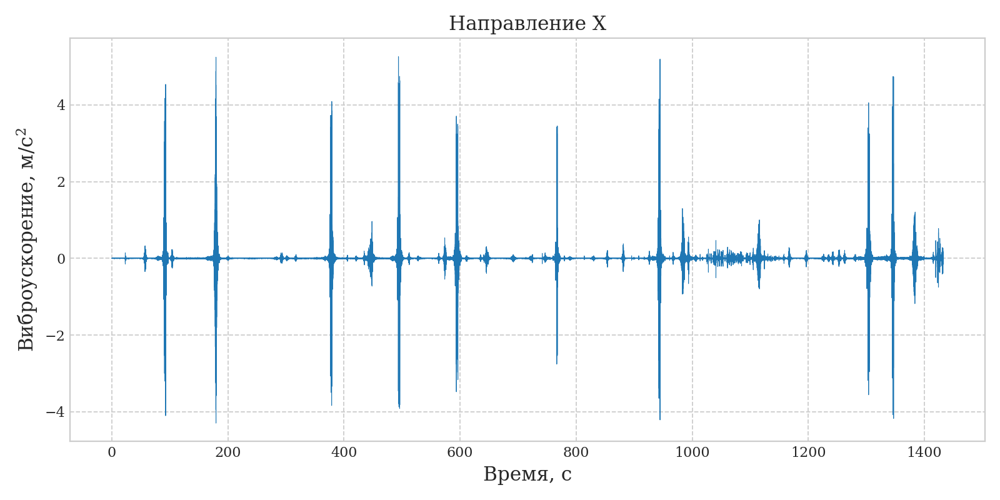

<IPython.core.display.Javascript object>


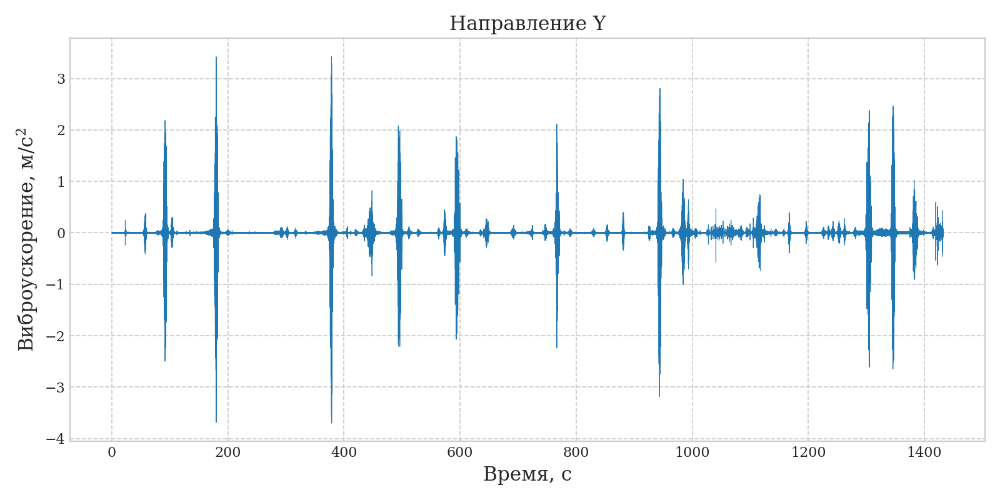

<IPython.core.display.Javascript object>


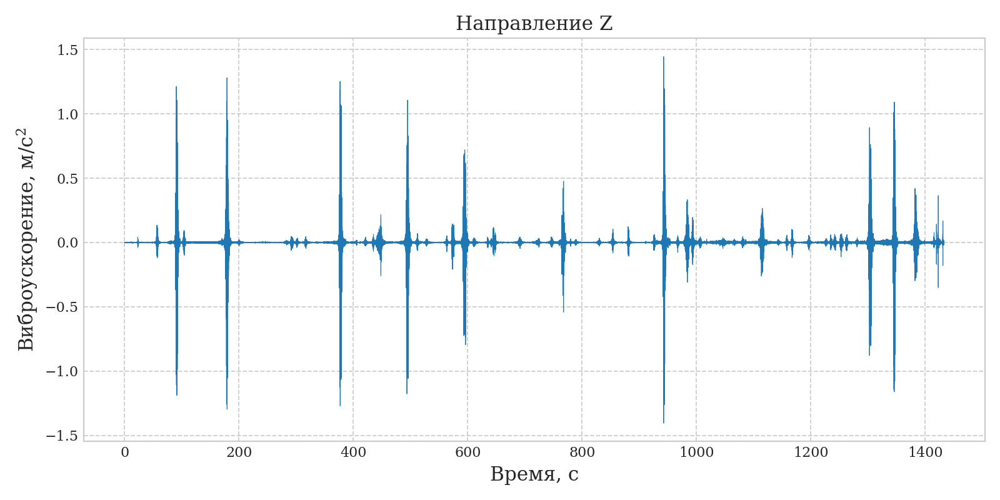

In [29]:
%matplotlib notebook
pic.signalpic(data=vibration_list, fs=fs, unit=unit, axes=axes, name=f'{project_name}_signal', save=1)

In [30]:
# filtration according to GOST (the exact number is missed)
sos = butter(2, [1, 315], btype='band', fs=fs, output='sos')

filtered = {}
for ax in axes:
    filtered[ax] = sosfilt(sos, vibration_list[ax]).flatten()  #flatten is needed if type(vibration_list[ax])=pd.DataFrame

### Spectrograms

<IPython.core.display.Javascript object>


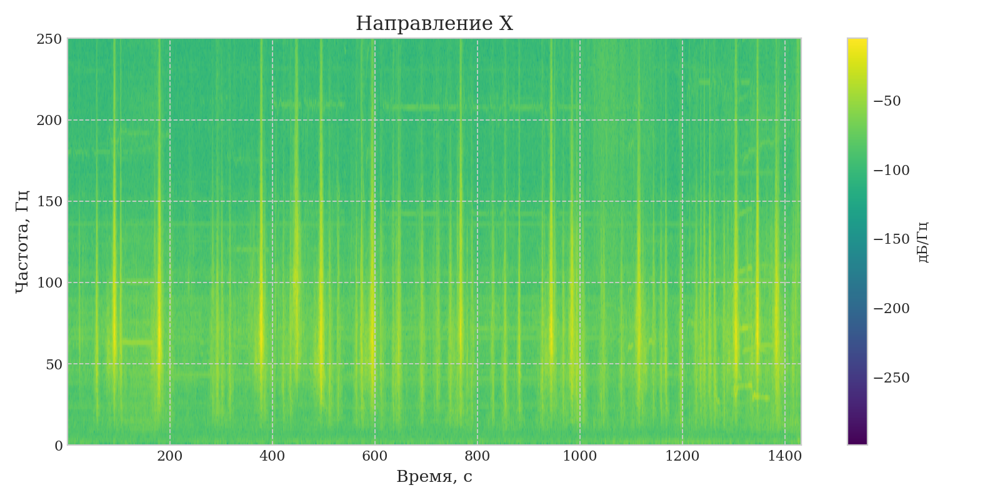

<IPython.core.display.Javascript object>


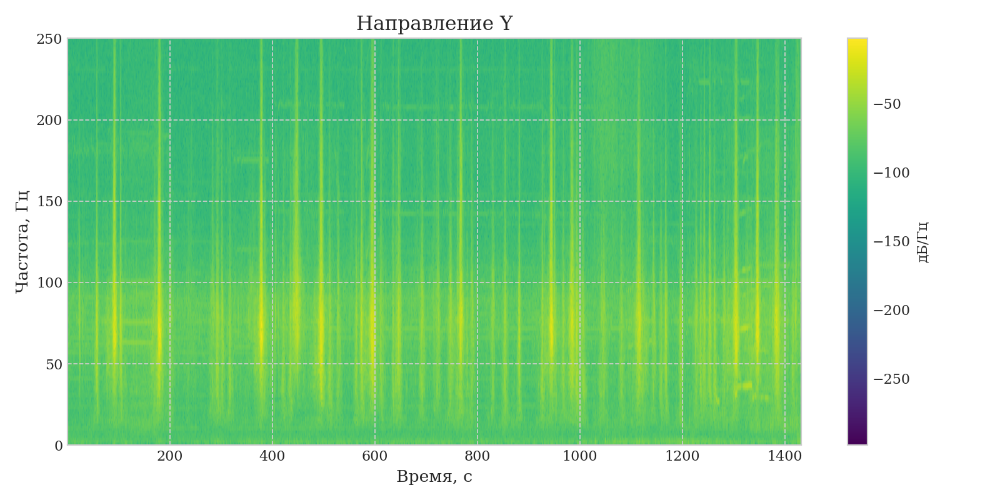

<IPython.core.display.Javascript object>


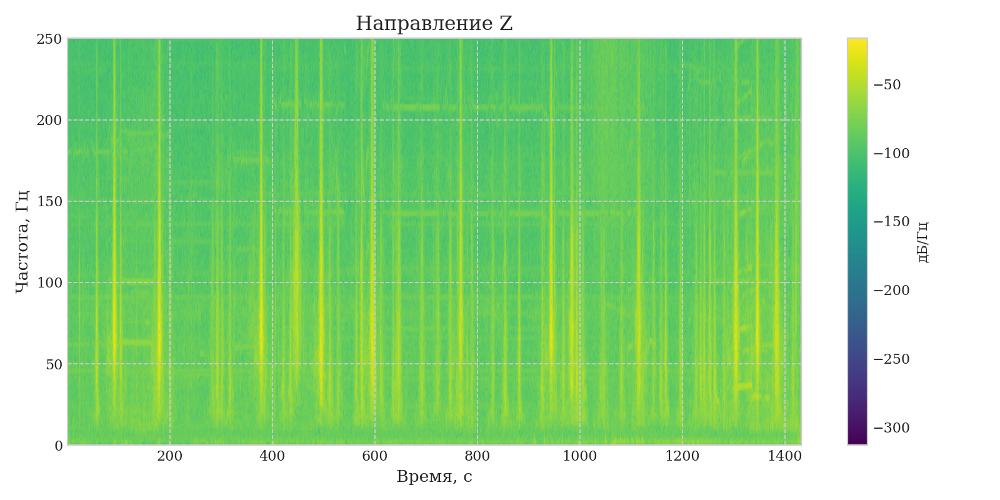

In [31]:
# import gc
NFFT = 1024  # the length of the windowing segments
# with plt.ioff():
for ax in axes:

    fig2, axs = plt.subplots(figsize=(10, 5), tight_layout=True)

    x = np.arange(0,  len(filtered[ax])) / fs
    y = filtered[ax]

#     Pxx, freqs, bins, im = axs.specgram(y, NFFT=NFFT, Fs=fs, noverlap=0, cmap='viridis')
    _, _, _, im = axs.specgram(y, NFFT=NFFT, Fs=fs, noverlap=128, cmap='viridis')
    fig2.colorbar(im, label='дБ/Гц')
    plt.ylim(0, 250)
    axs.set_title(f'Направление {ax}', fontsize=14)
    axs.set_xlabel('Время, с', fontsize=12)
    axs.set_ylabel('Частота, Гц', fontsize=12)
    axs.grid(visible='True', which='both', axis='both', ls='--')

    plt.savefig(f'{project_name}_spectr_{ax}.png', dpi=300)
    
    # if matplotlib consumes too much RAM unlock the following part
#     plt.close()
#     del fig2
#         gc.collect()

In [32]:
# stop interactive mode of pictures to save RAM
plt.close('all')

### Octave-band processing

In [33]:
vel, acc = calc.octaveband(data=filtered, fs=fs, unit=unit, F=Fv, fraction=1, axes=axes)

X has been processed
Y has been processed
Z has been processed


<IPython.core.display.Javascript object>


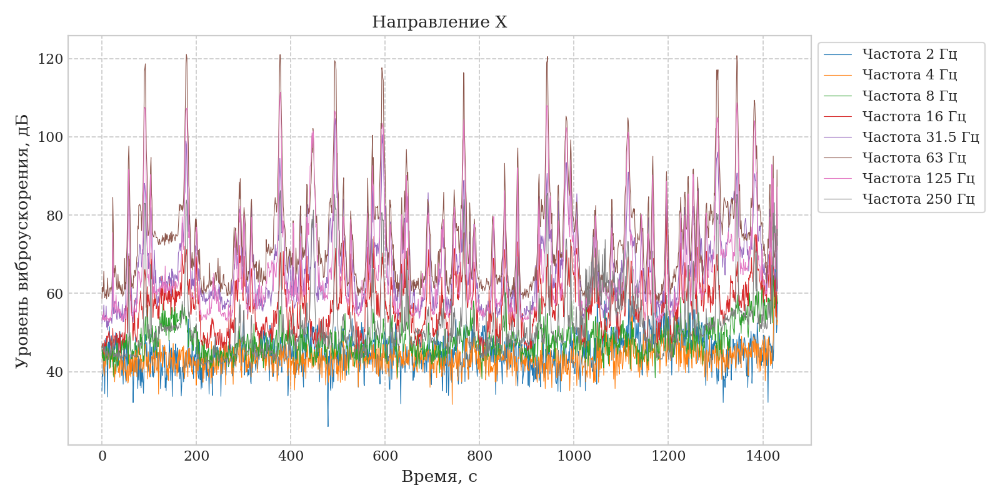

<IPython.core.display.Javascript object>


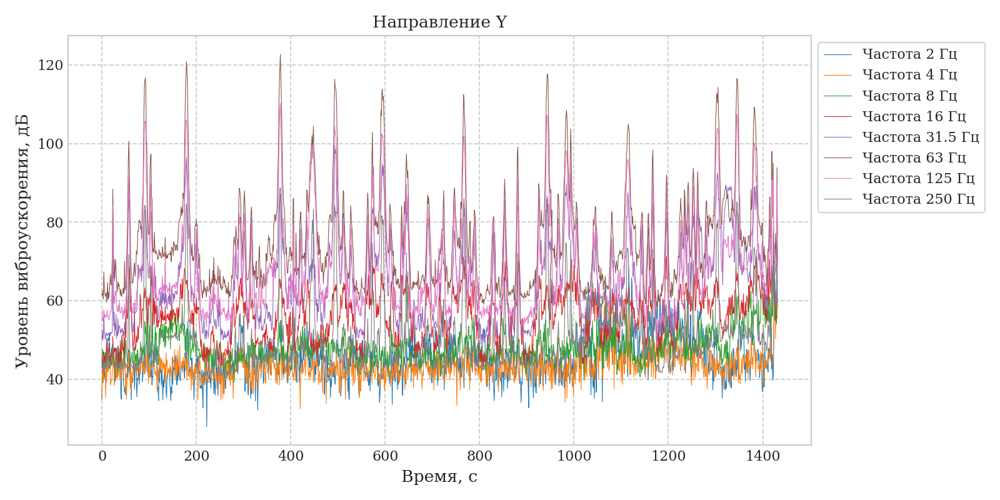

<IPython.core.display.Javascript object>


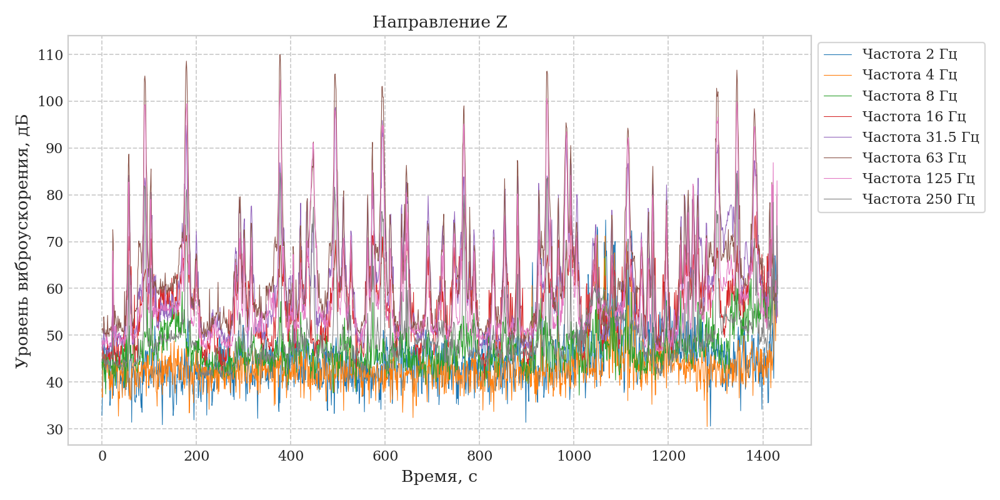

In [34]:
pic.bandspic(acc=acc, vel=vel, F=Fv[1:], res_param='La', unit=unit, name=f'{project_name}_bands', save=True)

### Individual trains detection
The approach is semi-manual. Sum of different frequencies multiplied by some factor is used to account contribution of the most distinctive ones and to reduce noisy ones.

It is only used for peaks detection and illustration purpose. It does not have any physical meaning. The factors are definrd by user. Recommended sum of factors is 100.

<IPython.core.display.Javascript object>


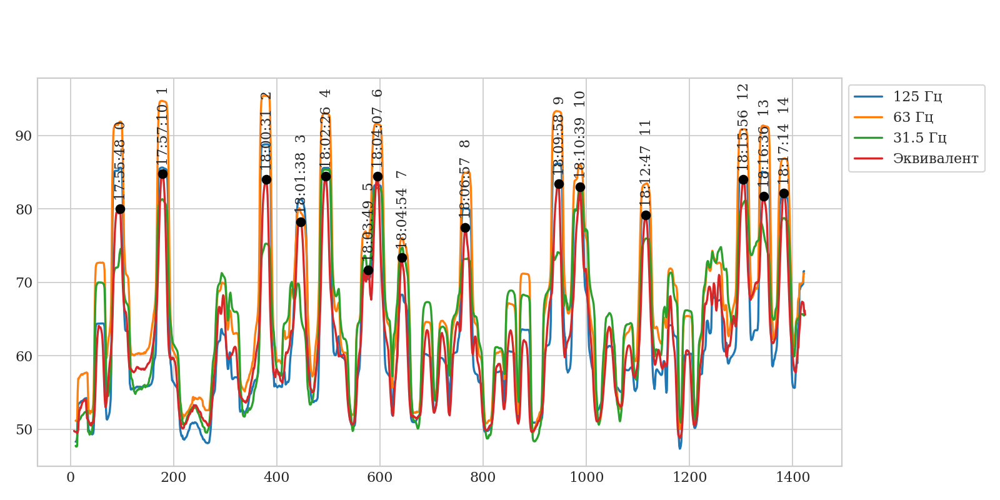

In [42]:
def energy_sum(data, F, deltaA = {8: 0, 16: 0, 31.5: 20, 63:50, 125: 30, 250: 0}):
    sum_level = data[F[0]] * deltaA[F[0]] / 100
    for f in F[1:]:
        sum_level += (data[f]) * deltaA[f] / 100
    return sum_level

# Finding peaks
%matplotlib notebook

import matplotlib.dates as mdates

direction = 'Z'
if device == 1:
    start_ = start//fs + 0
else:
    start_ = 30   # number that we used to cut signal

fig, axs = plt.subplots(1, figsize=(10, 5), tight_layout=True)

xtime = np.arange(0, len(acc[direction]))

now = init_time + timedelta(seconds=start_)


for j in [   # frequencies used for the visualization
#     250,
    125,
    63,
#     50,
    31.5,    
]:   #31.5,

    y_v1 = rs.val2db(acc[direction].loc[0:, j].rolling(20,center=True).mean(), 'a')

    axs.plot(xtime, y_v1, label=f'{j} Гц')


y1 = rs.val2db(energy_sum(acc[direction], F=[8,16,31.5,63,125,250])).rolling(15,center=True).mean()

axs.plot(xtime, y1, label=f'Эквивалент')



# use classic find_peaks parameters
max1 = 71.5
f_peaks = find_peaks(y1, height=max1, distance=10, prominence=1.5, width=1)
f_peak_pos = f_peaks[0][:]   #list of the peaks positions
# delete wrongly detected peaks from the list
peak_pos = np.delete(f_peak_pos, [
                                   ])

axs.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=10, frameon=True)
axs.plot(xtime[peak_pos[:]], y1.values[peak_pos[:]], "o", color = "k", linewidth=3, label='$ Максимумы $')\

# annotate trains with timestamp
if len(f_peak_pos) < 100 :
    for t, lv, i in zip(peak_pos, y1.values[peak_pos[:]], range(len(peak_pos))):
        axs.annotate((now + timedelta(seconds=int(t))).strftime('%H:%M:%S') + f'  {i}', xy=(xtime[t], lv),
                    xytext=(1, 6), textcoords="offset points",
                    horizontalalignment="center",
                    verticalalignment="bottom",
                    transform_rotates_text=True, rotation=90
                   )

### Visualizing detected peaks and saving pictures

<IPython.core.display.Javascript object>


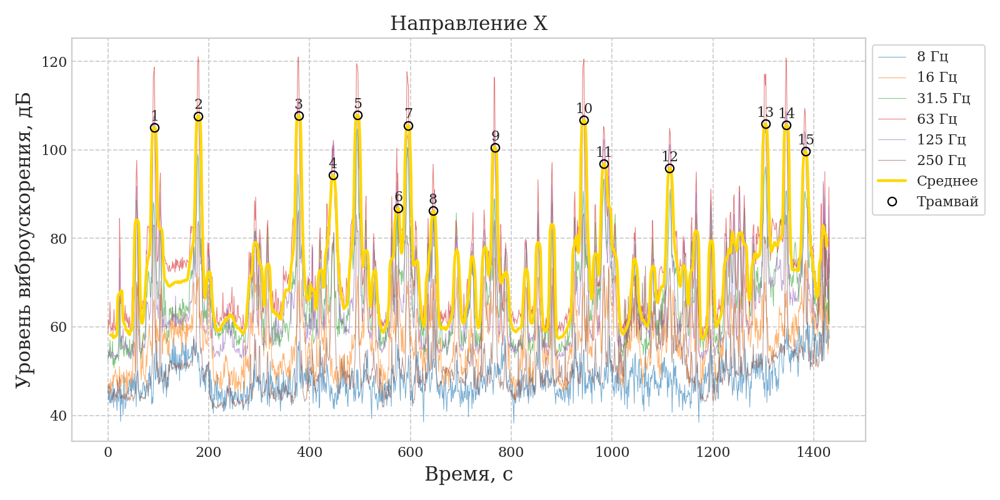

<IPython.core.display.Javascript object>


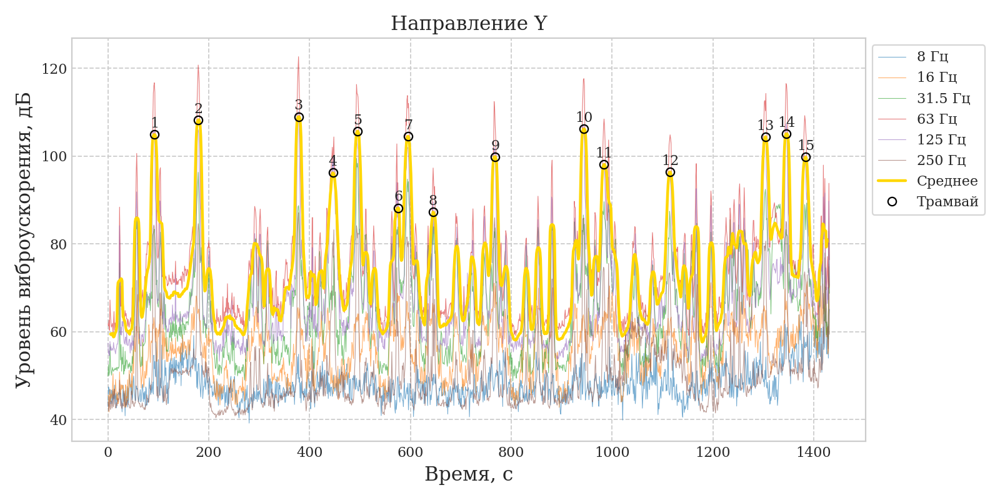

<IPython.core.display.Javascript object>


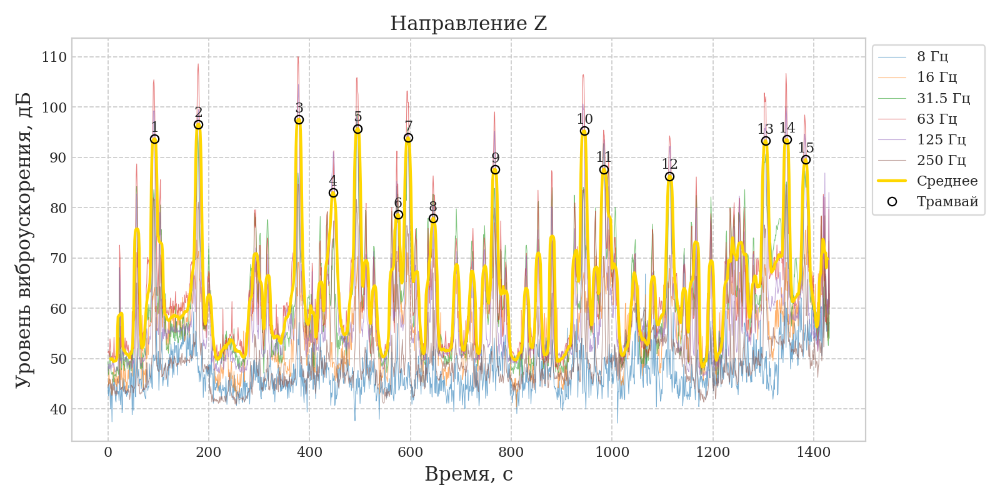

In [43]:
# Drawing plot with vibration levels
%matplotlib notebook

from adjustText import adjust_text

# label1 = 'Поезда'
label1 = 'Трамвай'
# label1 = 'Автомобиль'
# label1 = 'Метро'

# half interval is needed to pricisely detect peaks at each frequency within a small range,
# reference values (centers of search intervals) are defined at previous step
half_interval = 5   # this is less than the one used for params just to get more pricise positions

F_for_plot = Fv[3:]

for ax in axes:
    fig, axs = plt.subplots(figsize=(10, 5), tight_layout=True)

    x = np.arange(0,  len(acc[ax])) #/ fs
    y = rs.val2db(acc[ax])#.rolling(5,center=True).mean()

    y1 = rs.val2db(energy_sum(acc[ax], F=[8,16,31.5,63,125,250]).rolling(10,center=True).mean())

    axs.set_ylabel('Уровень виброускорения, дБ', fontsize=14)
    
    f_peak_pos = [y1.loc[peak_pos[i]-half_interval//1 :
                         peak_pos[i]+half_interval//1].idxmax() for i in range(len(peak_pos))]

    for i in F_for_plot:
        axs.plot(x, y.loc[:,i], linewidth=0.5, alpha=0.6, label=f'{i} Гц')
        
    axs.plot(x, y1, linewidth=2, color='gold' , label=f'Среднее')
    axs.plot(x[f_peak_pos[:]], y1.values[f_peak_pos[:]], 
             "o", fillstyle='none', markersize=6, color = "k", linewidth=3, label=label1)

    
    
    if len(f_peak_pos) < 100:
        annotations = []
        xs = []
        Lvs = []

        for t, Lv, train in zip(x[f_peak_pos], y1[f_peak_pos], range(1,len(f_peak_pos)+1)):
                xs.append(t)
                Lvs.append(Lv)
                annotations.append(axs.annotate(f'{train}', xy=(t, Lv),
#                                                 textcoords="offset points",
                                                horizontalalignment="center",
                                                verticalalignment="bottom")
                                  )

        adjust_text(annotations, y=Lvs, x=xs, only_move={'text':'y'}, force_text=(1.05,1.5), expand=(1.05,1.2),
                    autoalign='xy', ensure_inside_axes=False, max_move=10)
    


    axs.set_title(f'Направление {ax}', fontsize=14)
    axs.set_xlabel('Время, с', fontsize=14)
    axs.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=10, frameon=True)
    axs.grid(visible='True', which='both', axis='both', ls='--')
    
    plt.savefig(f'{project_name}_{res_param}_nums_La_{ax}.png', dpi=300)

### Calculating individual trains amplitudes

In [45]:
# To shut some pandas warning due to newer version
import warnings
warnings.filterwarnings('ignore')

In [46]:
params = calc.trains_calc(acc, peak_pos, half_interval=15, unit='abs')

# Find moments of trains pass in daytime
train_daytime = {}

for ax in axes:
    train_daytime[ax] = pd.DataFrame(data=None, index=None)
    
    for i in range(len(f_peak_pos)):
        for j in Fv:
            train_daytime[ax].loc[i,j] = (init_time + timedelta(seconds=params[3][ax].loc[i,j]+start_)).strftime('%H:%M:%S')

### Calculating statistics

<IPython.core.display.Javascript object>


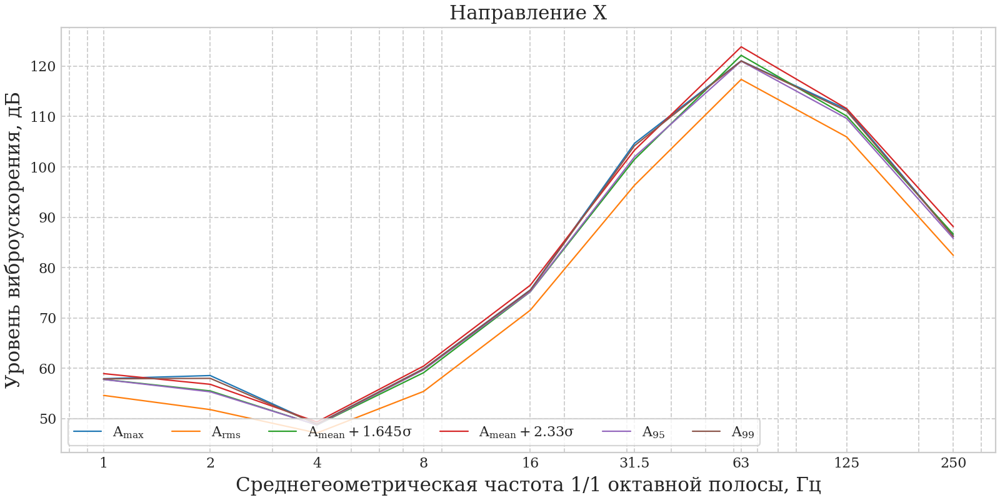

<IPython.core.display.Javascript object>


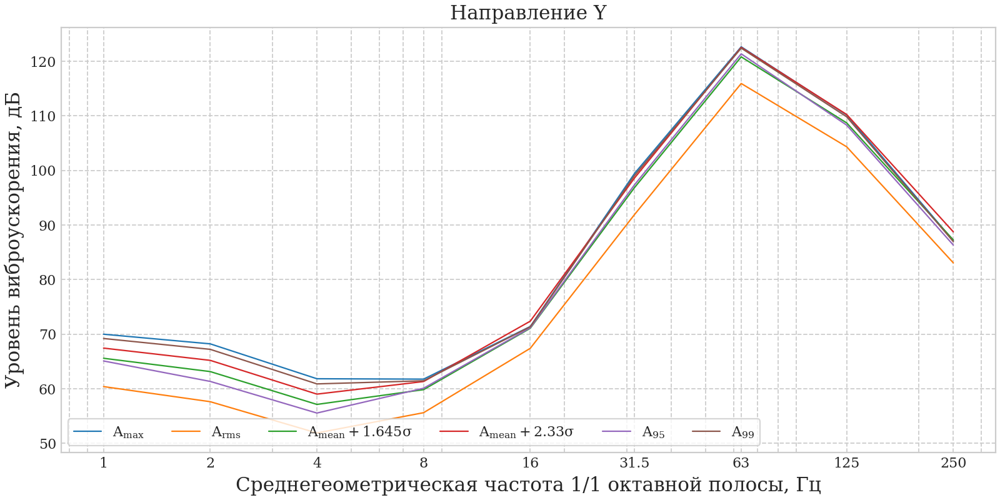

<IPython.core.display.Javascript object>


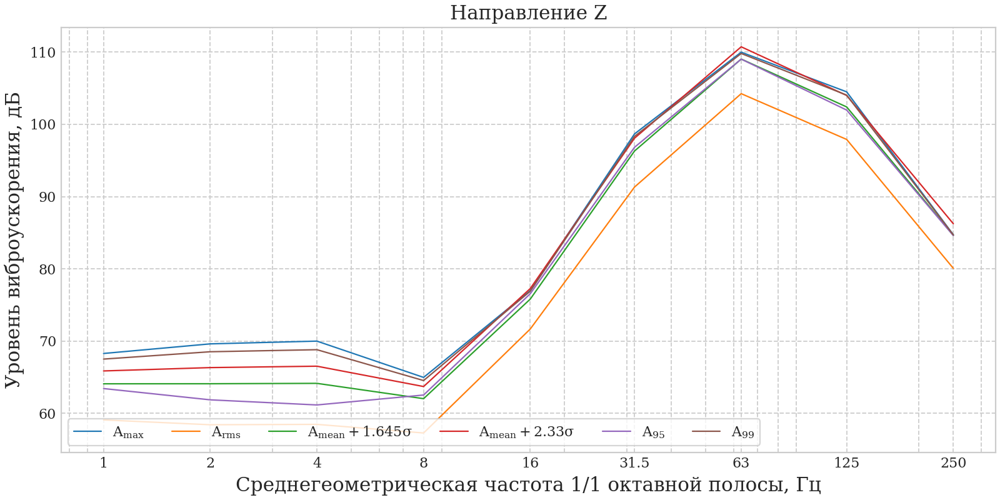

Report T6_trains_La is saved to: C:\Codes\trams vibration\Output\2023
Report T6_stat_results_La is saved to: C:\Codes\trams vibration\Output\2023
Report T6_trains_report_La is saved to: C:\Codes\trams vibration\Output\2023


In [47]:
Stat_max = calc.statistics(params[0], res_param=res_param, stat_params=[1,3,6,7,8,9], F=Fv) #stat_params=[1,2,6,7,8,9]
Stat_eq = calc.statistics(params[1], res_param=res_param, stat_params=[1,3,6,7,8,9], F=Fv)

pic.statpic(Stat_max, res_param=res_param, unit=unit, F=Fv, fraction=F, showvc=False, table=False, 
            name=f'{project_name1}_statmax_{res_param}', save=True)

report.trains_report(
    [params[0], params[1], params[-1]],
    train_daytime,
    res_param,
    unit=unit,
    stats = [Stat_max, Stat_eq], 
    name=f'{project_name1}_trains_{res_param}')

report.stat_report(stats=[Stat_max, Stat_eq], fraction=F, res_param=res_param, unit=unit,
            name=f'{project_name}_stat_results_{res_param}')

report.stat_report(stats=[params[0], params[1]], spec=[train_daytime, params[-1]],
                   specLabels=['№ п/п', 'Время прохода', 'Время воздействия, с'],
                   fraction=F, res_param=res_param, unit=unit,
                   name=f'{project_name1}_trains_report_{res_param}')

# Year 2020 data processing
Initial data is given as already processed 1-octave-bands (acceleration levels, dB) in .csv format.
Points were recorded one after another with breaks which are represented as -inf in the table. Columns are timestamps and octave-bands for X, Y and Z axes respectively.

T1 was recorded from 2850 to 2850+1050 (1st piece).

T5 was recorded from 2850+4800 to 2850+6000 seconds (5th piece).

Rerun code from these sections to process the next point.

In [55]:
# change saving directory
os.chdir(r"C:\Codes\trams vibration\Output\2020")

In [56]:
vibration_files = rs.selectfiles()

('C:/Codes/trams vibration/Data_raw/2020/Pogonnij_03072020_1200_2263-1_1oct.csv', 'C:/Codes/trams vibration/Data_raw/2020/Pogonnij_03072020_1300_2263-1_1oct.csv', 'C:/Codes/trams vibration/Data_raw/2020/Pogonnij_03072020_1400_2263-1_1oct.csv', 'C:/Codes/trams vibration/Data_raw/2020/Pogonnij_03072020_1500_2263-1_1oct.csv')


In [57]:
# Initial data

axes = ['X','Y','Z']   # by default ['X','Y','Z']
F1_1 = [1, 2, 4, 8, 16, 31.5, 63, 125, 250, 500, 1000, 2000, 4000, 8000, 16000]

signal = False   # or preprocessed bands
device = 1
# 1 - ZetLab
# 2 - SS-box
# 3 - Ecofizika


per_sec = 1   # number of records per second 1 or 3 for non-signal
F = '1/1'   # 1/1-octave or 1/3-octave band in output
if F == '1/1':
    Fv = F1_1[F1_1.index(1):F1_1.index(250)+1]
if F == '1/3':
    Fv = F1_3[F1_3.index(0.8):F1_3.index(315)+1]
    Fv1 = F1_1[F1_1.index(1):F1_1.index(250)+1]
res_param = 'La'   # a - acceleration, v - velocity, La - acc in dB, Lv - vel in dB
unit='La'   # units of initial files

project_name = 'T1'
print(f'Project name: {project_name}')

try:
    if (device == 1) & (signal == False):
        init_time = datetime.strptime(Path(vibration_files[0]).stem[-16:-12], '%H%M')
    elif (device == 3) & (signal == False):
        init_time = datetime.strptime(Path(vibration_files[0]).stem, '%H_%M_%S')
    elif (device == 3) & (signal == True):
        inf = pd.read_csv(vibration_files[0], sep=' ', encoding='mbcs', header=None, names = None,
                           skiprows=1, nrows=1).reset_index(drop=True)
        init_time = datetime.strptime(inf.iloc[0, 0][9:], '%H:%M:%S')
    else:
    #     raise NotImplementedError('Я что-то нажала и все пропало! (Нужно дополнить код)')
        init_time = datetime.strptime(input('Введите начало записи (HHMMSS): '), '%H%M%S')
except ValueError:
    init_time = datetime.strptime(input('Введите начало записи (HHMMSS): '), '%H%M%S')
        
print(f'Начало записи было в {init_time}')

Project name: T1
Начало записи было в 1900-01-01 12:00:00


In [65]:
# This step may require a few iterations if there are multiple consecutive records on one device

# to cut possible outliers in the beginning and end of the selected piece
cut_outliers = 20
column_used_for_pieces_detection = 7

if not signal:
    ### For Bochka files
    if device == 1:
        fs = per_sec
        
        if read_once == False: # prevents rereading long files
            vibration = [pd.read_csv(file, header=None, skiprows=1, skipfooter=1, engine='python') 
                         for file in vibration_files]

            # Merge multiple initial files into one
            vibration_df = pd.concat(vibration[:]).reset_index(drop=True)

            read_once = True   
            del vibration
        
        """ 
        Finding the beginning of the record
        At initial step (to see the full record) set cut_start = 0.
        If there are multiple consecutive records on one device, one might want to cut some parts.
        Approximate value might be given falling into the 'break', the precise one will be calculated.
        """
        cut_start = 0 #2850+4800
        for start in range(cut_start, len(vibration_df)):
            if vibration_df.iloc[start,column_used_for_pieces_detection] > 0:
                break

        """
        Finding the end of the record
        to remove unwanted parts after the needed one and skip zeros (or -inf).
        Mute this part and use `end = 0` at the initial iteration.
        `cut_end` value is number of rows (seconds) from the beginning of the whole record to 
        Approximate value might be given falling into the 'break', the presize one will be calculated.
        """
        cut_end = 1050 #1200
        for end in range(len(vibration_df) - start - cut_end, len(vibration_df)):
            if vibration_df.iloc[-1*end,column_used_for_pieces_detection] > 0 :
                break
#         end = 0

        # splitting columns into corresponding axes
        vibration_list = {}
        for k in range(3):
            ax = axes[k]
            vibration_list[ax] = vibration_df.iloc[start +cut_outliers : -1*end -cut_outliers,
                                                   k*(len(Fv)+2)+2:(k+1)*(len(Fv)+2)
                                                  ].set_axis(Fv, axis='columns').reset_index(drop=True)
            

In [68]:
    vibration_list['Z'].tail()

,1.0,2.0,4.0,8.0,16.0,31.5,63.0,125.0,250.0
977,20.4070,27.534,28.851,48.202,65.990,74.665,88.228,79.967,58.196
978,18.8300,19.722,28.662,49.731,65.126,76.112,89.513,80.130,57.919
979,8.9343,13.247,33.675,49.854,63.510,75.190,87.493,78.829,56.357
980,13.4440,18.107,29.173,45.748,66.385,73.365,90.590,81.244,57.876
981,11.8940,17.135,31.475,44.720,65.029,77.797,99.474,90.554,68.845


In [67]:
# cut possible outliers in the beginning and end of the record
if project_name == 'T1':
    for ax in axes:
        vibration_list[ax] = rs.cut_edges(vibration_list[ax], cut=[15*fs,1*fs])

In [69]:
if not signal:
    acc = vibration_list
    vel = 0

<IPython.core.display.Javascript object>


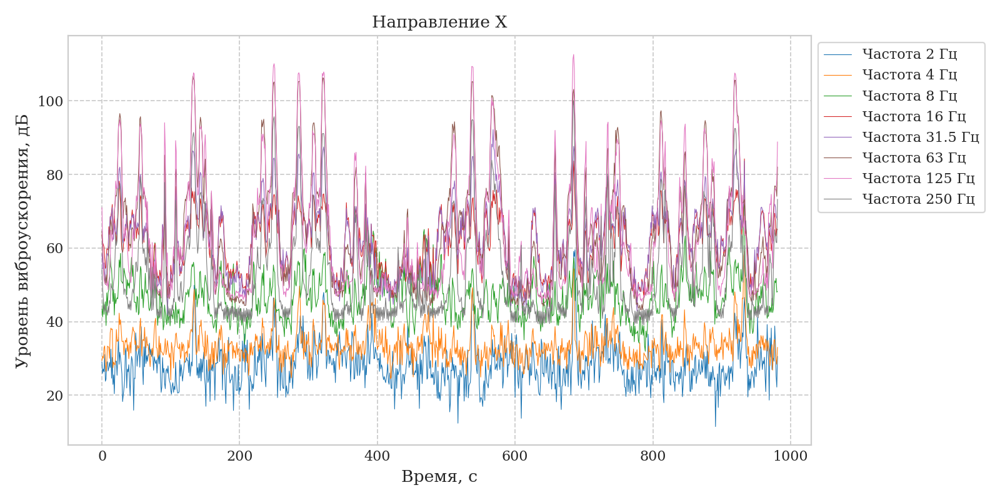

<IPython.core.display.Javascript object>


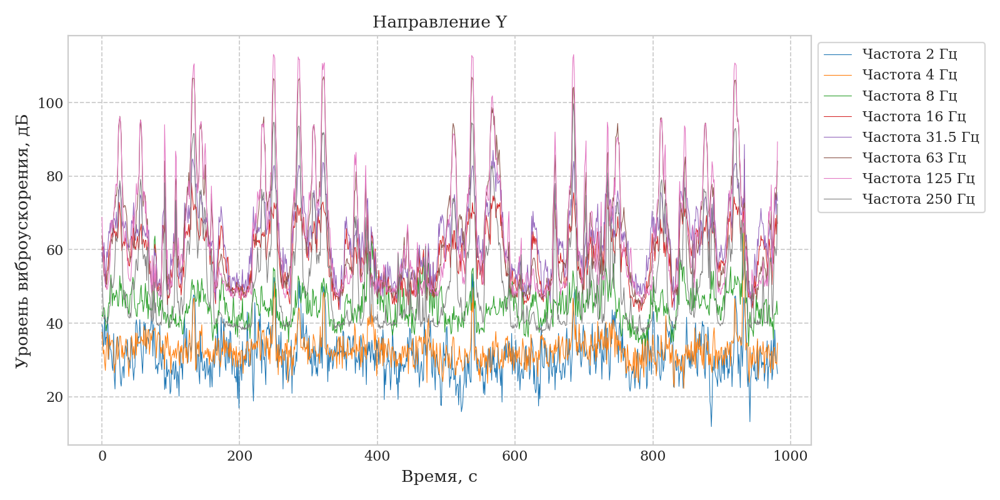

<IPython.core.display.Javascript object>


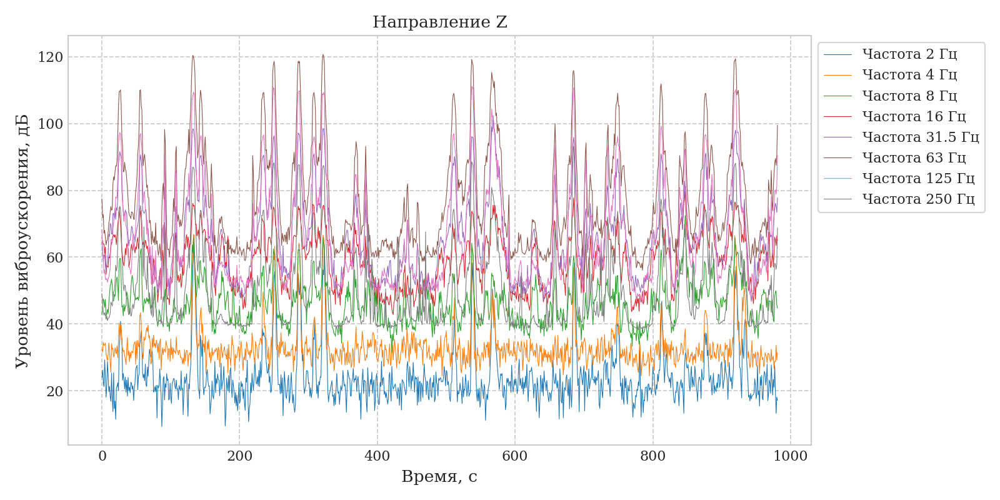

In [70]:
%matplotlib notebook
unit = 'La'
pic.bandspic(acc=acc, vel=vel, F=Fv[1:], res_param='La', unit=unit, name=f'{project_name}_bands', save=True)

## The following workflow is the same as for the year 2023 part

### Individual trains detection

<IPython.core.display.Javascript object>


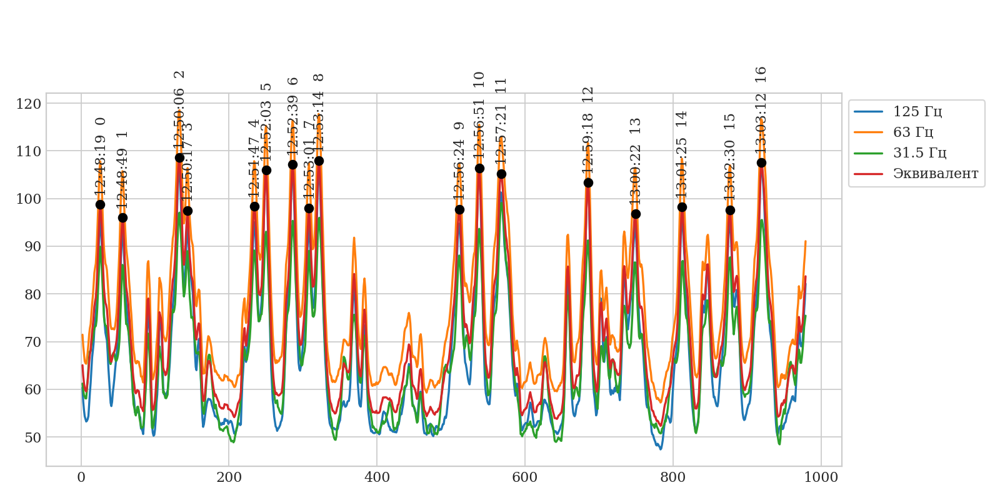

In [71]:
def energy_sum(data, F, deltaA = {8: 0, 16: 0, 31.5: 30, 63:40, 125: 30, 250: 0}):
    sum_level = data[F[0]] * deltaA[F[0]] / 100
    for f in F[1:]:
        sum_level += (data[f]) * deltaA[f] / 100
    return sum_level

# Finding peaks
%matplotlib notebook

import matplotlib.dates as mdates

direction = 'Z'
if device == 1:
    start_ = start//fs + cut_outliers
else:
    start_ = 30   # number that we used to cut signal

fig, axs = plt.subplots(1, figsize=(10, 5), tight_layout=True)

xtime = np.arange(0, len(acc[direction]))

now = init_time + timedelta(seconds=start_)


for j in [   # frequencies used for the visualization
#     250,
    125,
    63,
#     50,
    31.5,    
]:   #31.5,

    y_v1 = acc[direction].loc[0:, j].rolling(5,center=True).mean()

    axs.plot(xtime, y_v1, label=f'{j} Гц')


y1 = energy_sum(acc[direction], F=[8,16,31.5,63,125,250]).rolling(5,center=True).mean()

axs.plot(xtime, y1, label=f'Эквивалент')



# use classic find_peaks parameters
max1 = 90
f_peaks = find_peaks(y1, height=max1, distance=10, prominence=1.5, width=1)
f_peak_pos = f_peaks[0][:]   #list of the peaks positions
# delete wrongly detected peaks from the list
peak_pos = np.delete(f_peak_pos, [
                                   ])

axs.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=10, frameon=True)
axs.plot(xtime[peak_pos[:]], y1.values[peak_pos[:]], "o", color = "k", linewidth=3, label='$ Максимумы $')\

# annotate trains with timestamp
if len(peak_pos) < 100 :
    for t, lv, i in zip(peak_pos, y1.values[peak_pos[:]], range(len(peak_pos))):
        axs.annotate((now + timedelta(seconds=int(t))).strftime('%H:%M:%S') + f'  {i}', xy=(xtime[t], lv),
                    xytext=(1, 6), textcoords="offset points",
                    horizontalalignment="center",
                    verticalalignment="bottom",
                    transform_rotates_text=True, rotation=90
                   )

### Visualizing detected peaks and saving pictures

<IPython.core.display.Javascript object>


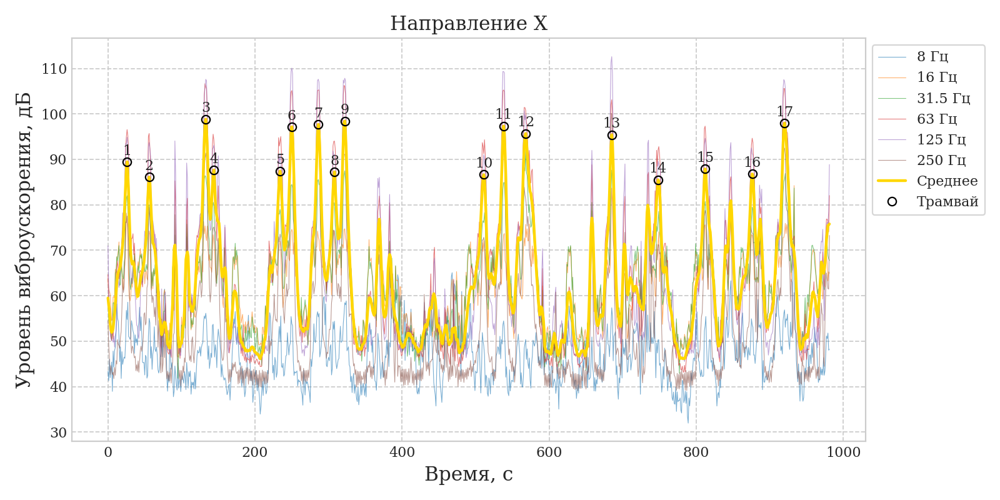

<IPython.core.display.Javascript object>


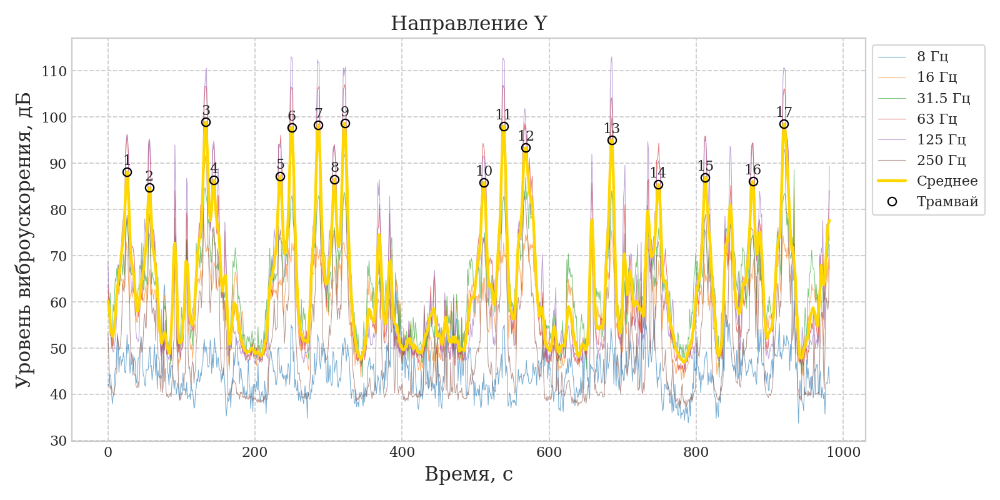

<IPython.core.display.Javascript object>


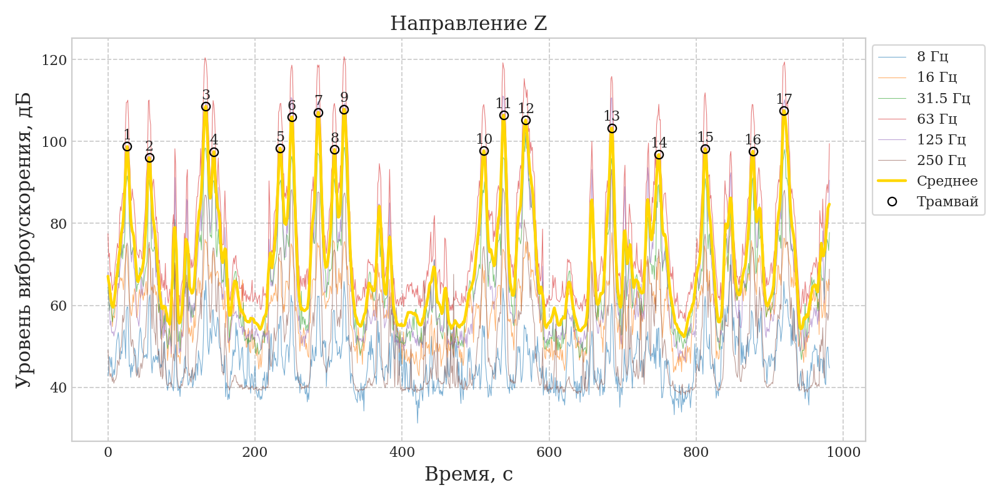

In [72]:
# Drawing plot with vibration levels
%matplotlib notebook

from adjustText import adjust_text

# label1 = 'Поезда'
label1 = 'Трамвай'
# label1 = 'Автомобиль'
# label1 = 'Метро'

# half interval is needed to pricisely detect peaks at each frequency within a small range,
# reference values (centers of search intervals) are defined at previous step
half_interval = 5   # this is less than the one used for params just to get more pricise positions

F_for_plot = Fv[3:]

for ax in axes:
    fig, axs = plt.subplots(figsize=(10, 5), tight_layout=True)

    x = np.arange(0,  len(acc[ax])) #/ fs
    y = acc[ax]#.rolling(5,center=True).mean()

    # rolling mean is used only for visualiztion, real values are calculated without it
    y1 = energy_sum(acc[ax], F=[8,16,31.5,63,125,250]).rolling(5,center=True, min_periods=1).mean()

    axs.set_ylabel('Уровень виброускорения, дБ', fontsize=14)
    
    f_peak_pos = [y1.loc[peak_pos[i]-half_interval
                         : peak_pos[i]+half_interval].idxmax() for i in range(len(peak_pos))]

    for i in F_for_plot:
        axs.plot(x, y.loc[:,i], linewidth=0.5, alpha=0.6, label=f'{i} Гц')
        
    axs.plot(x, y1, linewidth=2, color='gold' , label=f'Среднее')
    axs.plot(x[f_peak_pos[:]], y1.values[f_peak_pos[:]], 
             "o", fillstyle='none', markersize=6, color = "k", linewidth=3, label=label1)

    
    
    if len(f_peak_pos) < 100:
        annotations = []
        xs = []
        Lvs = []

        for t, Lv, train in zip(x[f_peak_pos], y1[f_peak_pos], range(1,len(f_peak_pos)+1)):
                xs.append(t)
                Lvs.append(Lv)
                annotations.append(axs.annotate(f'{train}', xy=(t, Lv),
#                                                 textcoords="offset points",
                                                horizontalalignment="center",
                                                verticalalignment="bottom")
                                  )

        adjust_text(annotations, y=Lvs, x=xs, only_move={'text':'y'}, force_text=(1.05,1.5), expand=(1.05,1.2),
                    autoalign='xy', ensure_inside_axes=False, max_move=10)
    


    axs.set_title(f'Направление {ax}', fontsize=14)
    axs.set_xlabel('Время, с', fontsize=14)
    axs.legend(bbox_to_anchor=(1, 1), loc='upper left', fontsize=10, frameon=True)
    axs.grid(visible='True', which='both', axis='both', ls='--')
    
    plt.savefig(f'{project_name}_{res_param}_nums_La_{ax}.png', dpi=300)

### Calculating individual trains amplitudes

In [73]:
unit='dB'  # careful as the following functions use only 'dB' or other. For La, Lv use 'dB'

params = calc.trains_calc(acc, peak_pos, half_interval=15, unit=unit)

# Find moments of trains pass in daytime
train_daytime = {}

for ax in axes:
    train_daytime[ax] = pd.DataFrame(data=None, index=None)
    
    for i in range(len(f_peak_pos)):
        for j in Fv:
            train_daytime[ax].loc[i,j] = (init_time + timedelta(seconds=params[3][ax].loc[i,j]+start_)).strftime('%H:%M:%S')

### Calculating statistics

<IPython.core.display.Javascript object>


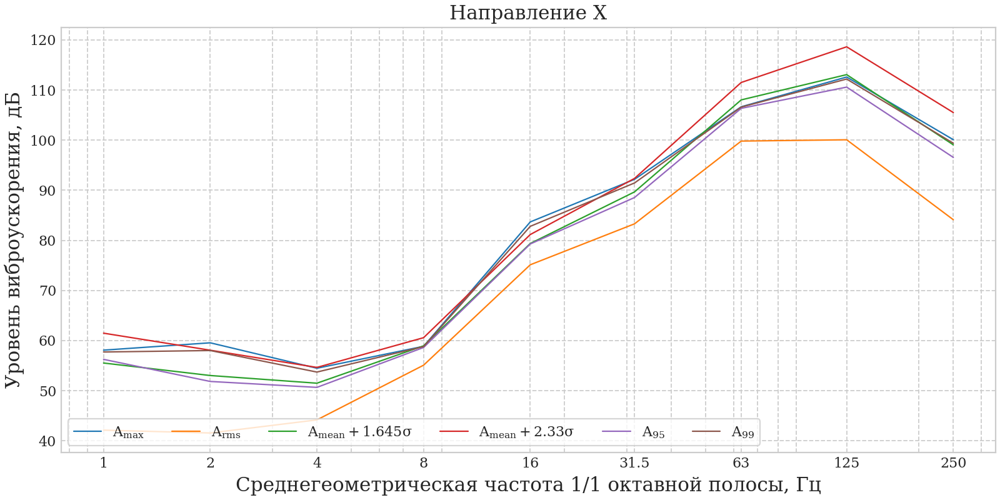

<IPython.core.display.Javascript object>


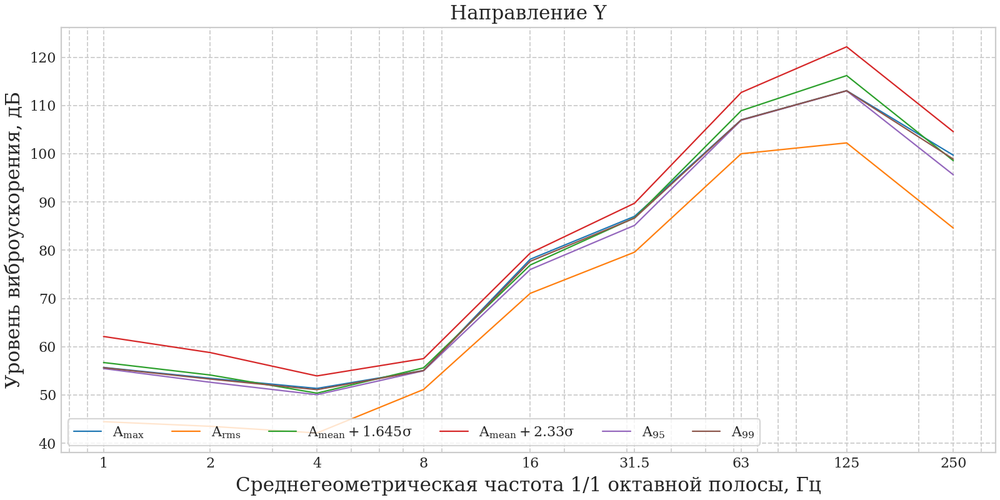

<IPython.core.display.Javascript object>


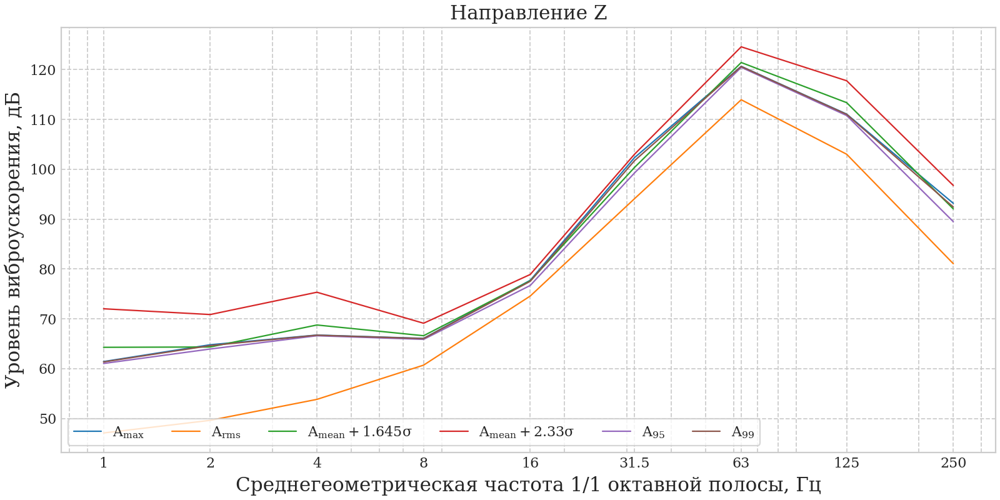

Report T1_trains_La is saved to: C:\Codes\trams vibration\Output\2020
Report T1_stat_results_La is saved to: C:\Codes\trams vibration\Output\2020
Report T1_trains_report_La is saved to: C:\Codes\trams vibration\Output\2020


In [74]:
Stat_max = calc.statistics(params[0], res_param=res_param, stat_params=[1,3,6,7,8,9], F=Fv) #stat_params=[1,2,6,7,8,9]
Stat_eq = calc.statistics(params[1], res_param=res_param, stat_params=[1,3,6,7,8,9], F=Fv)

pic.statpic(Stat_max, res_param=res_param, unit=unit, F=Fv, fraction=F, showvc=False, table=False, 
            name=f'{project_name}_statmax_{res_param}', save=True)

report.trains_report(
    [params[0], params[1], params[-1]],
    train_daytime,
    res_param,
    unit=unit,
    stats = [Stat_max, Stat_eq], 
    name=f'{project_name}_trains_{res_param}')

report.stat_report(stats=[Stat_max, Stat_eq], fraction=F, res_param=res_param, unit=unit,
            name=f'{project_name}_stat_results_{res_param}')

report.stat_report(stats=[params[0], params[1]], spec=[train_daytime, params[-1]],
                   specLabels=['№ п/п', 'Время прохода', 'Время воздействия, с'],
                   fraction=F, res_param=res_param, unit=unit,
                   name=f'{project_name}_trains_report_{res_param}')

# Comparison

In [75]:
# change saving directory
os.chdir(r"C:\Codes\trams vibration\Output\Comparison")
save_name = 'Comparison_straight'

In [48]:
def diff(datas, axes=axes, Fv=Fv):
    a = {}
    for ax in axes:
        a[ax] = pd.Series(data=None, index=None, dtype='float64')
        for f in Fv:
            try:
                if type(datas[1][ax].index[0]) == str:
                    a[ax].loc[f] = datas[0][ax].loc[f] - datas[1][ax].loc[str(f)]
                else:
                    a[ax].loc[f] = datas[0][ax].loc[f] - datas[1][ax].loc[f]
            except KeyError:
                pass
    return a

In [51]:
# Multiple file selection from different folders

import tkinter as tk
from tkinter import filedialog

root = tk.Tk()
root.withdraw()

our_files = []
while True:
    our_file = filedialog.askopenfilename(parent=root, initialdir='',
                                                  title='Select DSystems record files')
    # selection stops after clicking "Cancel" in the window
    if our_file == '':
        break
    our_files.append(our_file)

print(our_files)

['C:/Codes/trams vibration/Output/2023/T6_stat_results_La.xlsx', 'C:/Codes/trams vibration/Output/2020/T1_stat_results_La.xlsx']


In [76]:
# Loading Max of peak values
datas_max = [report.load_my_data(our_files[i], Fv, nsplits=1, paramnum=0, nrows=6, 
                          num_stats=2, init_rows=4) for i in range(len(our_files))]
# Loading RMS of peak values
datas_rms = [report.load_my_data(our_files[i], Fv, nsplits=1, paramnum=1, nrows=6, 
                           num_stats=2, init_rows=4) for i in range(len(our_files))]

<IPython.core.display.Javascript object>


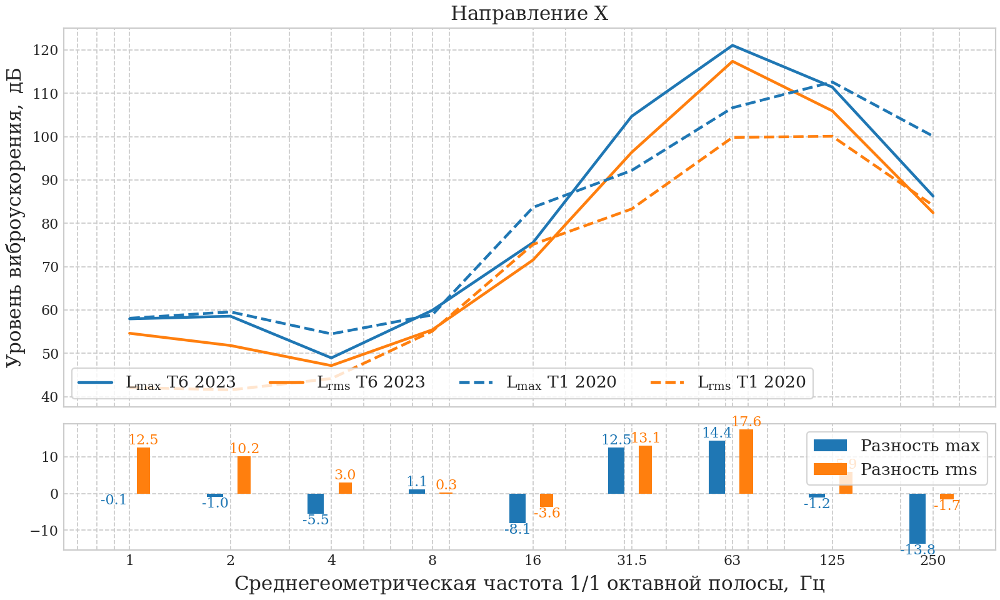

<IPython.core.display.Javascript object>


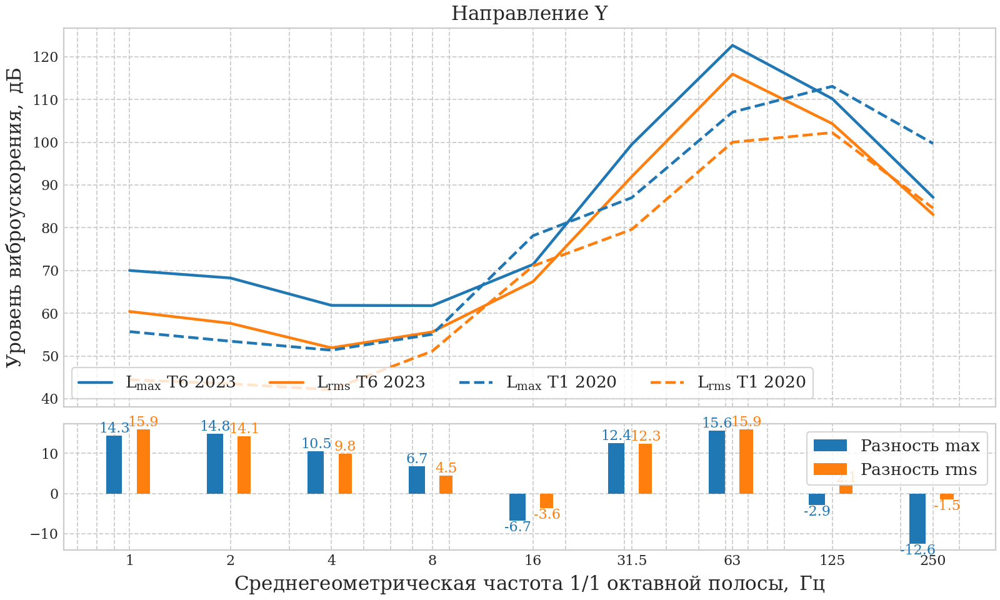

<IPython.core.display.Javascript object>


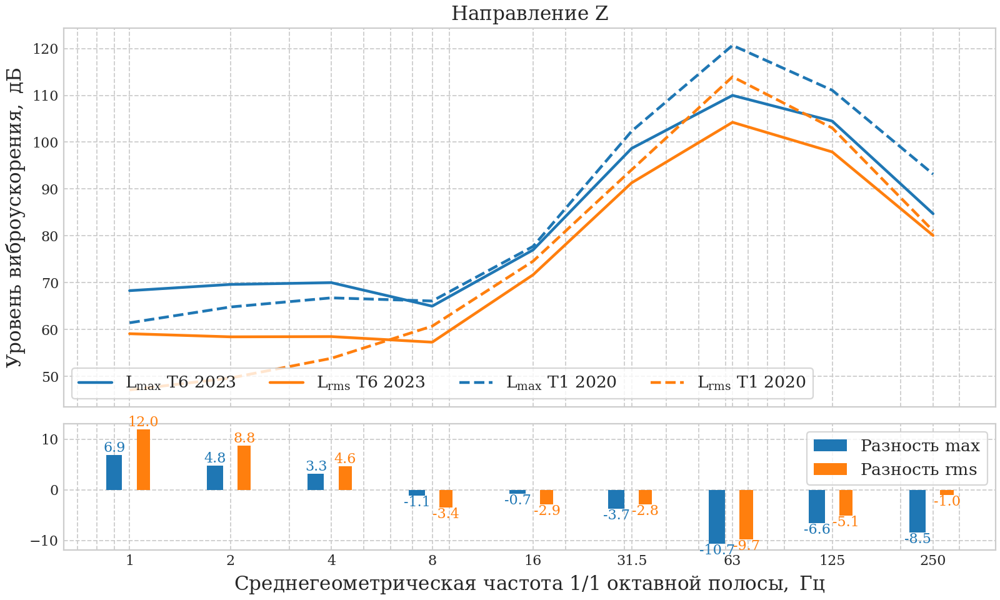

In [77]:
labels_max=['$ L_{max}\ T6\ 2023 $', '$ L_{max}\ T1\ 2020 $']
labels_rms=['$ L_{rms}\ T6\ 2023 $', '$ L_{rms}\ T1\ 2020 $']
dif_max = diff(datas_max)
dif_rms = diff(datas_rms)

x=[Fv[:],Fv[:]]
for ax in axes:
    fig, axs = plt.subplots(2,1, figsize=(10, 6), constrained_layout=True, sharex=True,
                            gridspec_kw={'height_ratios': [3, 1], 'hspace': 0.0})
    axs[0].set_xscale('log')
    axs[0].set_xticks(ticks=Fv, labels=Fv)

    
    axs[0].plot(x[0], datas_max[0][ax], linewidth=2, label=labels_max[0], color='C0')
    axs[0].plot(x[0], datas_rms[0][ax], linewidth=2, label=labels_rms[0], color='C1')
    
    axs[0].plot(x[1], datas_max[1][ax], linewidth=2, label=labels_max[1], color='C0', ls='--')
    axs[0].plot(x[1], datas_rms[1][ax], linewidth=2, label=labels_rms[1], color='C1', ls='--')

    axs[0].set_title(f'$ Направление\ {ax} $', fontsize=14)
    axs[1].set_xlabel(f'$ Среднегеометрическая\ частота\ {F}\ октавной\ полосы,\ Гц $', fontsize=14)

#   axs[0].set_ylabel('$ Виброскорость,\ мкм/с $', fontsize=14)
    axs[0].set_ylabel('$ Уровень\ виброускорения,\ дБ $', fontsize=14)
    axs[0].legend(loc="lower left", ncol=6, fontsize=12, frameon=True)
    axs[0].grid(visible='True', which='both', axis='both', ls='--')

    # Plot histograms
    width = dif_max[ax].index/10       # the width of the bars
    axs[1].bar(dif_max[ax].index-width, dif_max[ax], [width[x] for x in range(dif_max[ax].shape[0])], 
               bottom=0, label=f'$ Разность\ max $')
    axs[1].bar(dif_rms[ax].index+width, dif_rms[ax], [width[x] for x in range(dif_rms[ax].shape[0])], 
               bottom=0, label=f'$ Разность\ rms $')
    axs[1].bar_label(axs[1].containers[0], fmt='%.1f', label_type='edge', color='C0')
    axs[1].bar_label(axs[1].containers[1], fmt='%.1f', label_type='edge', color='C1')
    axs[1].grid(visible='True', which='both', axis='both', ls='--')
    axs[1].legend(loc="best", ncol=1, fontsize=12, frameon=True)

    plt.savefig(f'{save_name}_stat_{ax}.png', dpi=300)

### Save differences numbers

In [78]:
import xlsxwriter

workbook = xlsxwriter.Workbook(f'{save_name}_difference.xlsx', {'strings_to_numbers':  True})

num_format = workbook.add_format({
    'num_format': 'General',
    'font_name': 'Times New Roman',
    'font_size': 9})
cell_format = workbook.add_format({
    'font_name': 'Times New Roman',
    'font_size': 9,
    'align': 'center',
    'text_wrap': True})

for ax in axes:
    
    worksheet = workbook.add_worksheet(f'Ось {ax}')

    worksheet.write(0, 0, 'Частота, Гц', cell_format)
    worksheet.write(1, 0,'Разность Max', cell_format)
    worksheet.write(2, 0,'Разность RMS', cell_format)

    freq = Fv

    for i in range(len(freq)):
        worksheet.write(0, i+1,
                       f'{Fv[i]}', cell_format)
        worksheet.write(1, i+1,
                       f'{dif_max[ax][Fv[i]]}', cell_format)
        worksheet.write(2, i+1,
                       f'{dif_rms[ax][Fv[i]]}', cell_format)

        
workbook.close()

print(f'Report {save_name}_diff is saved to: {os.getcwd()}')

Report Comparison_straight_diff is saved to: C:\Codes\trams vibration\Output\Comparison
